In [1]:
import pandas as pd
import numpy as np
import sympy as sp
import zsh_in_jupyter as jz
import matplotlib as mpl
import matplotlib.pyplot as plt
sp.init_printing()
%config InlineBackend.figure_format='svg' 

In [2]:
from scipy import stats

In [64]:
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import matplotlib
import os
import datetime #日期
from scipy import stats 
import random

# 实操

## 数据读取

In [65]:
#所有股票
data_origin=pd.read_excel('沪深300日数据.xlsx',)
data_origin=data_origin.set_index('Date').drop('股票').astype(float) #,encoding='gbk

In [66]:
data_stock_price=data_origin.iloc[:,[18,2,3,4,6,9,11,12,15,16]]

In [67]:
data_stock=(data_stock_price/data_stock_price.shift(1)-1).copy().iloc[1:]*100
data_stock.index=pd.to_datetime(data_stock.index)

In [68]:
data_s = data_stock.copy()
data_s

,000651.SZ,601318.SH,600036.SH,000858.SZ,600900.SH,601166.SH,600030.SH,601888.SH,600887.SH,000568.SZ
Date,,,,,,,,,,
2010-01-05,-2.911932,1.261830,0.112931,1.049285,0.075815,-1.926040,4.889741,0.192864,4.622322,-0.556586
2010-01-06,-2.158010,-2.125710,-2.086858,-2.643172,-0.606061,-1.047395,-1.157831,-2.743022,-1.508621,-1.439232
2010-01-07,-4.299065,-1.853585,-2.592166,-3.038138,-1.295732,0.476316,-2.435265,3.166749,-3.318745,-2.055165
2010-01-08,2.304688,-0.591377,0.000000,-0.200000,0.308880,0.026337,1.927330,-1.630695,0.678989,1.656543
2010-01-11,-2.825506,0.498945,0.177410,-0.935204,0.230947,-1.974724,3.595784,-1.803998,4.983140,-3.313417
...,...,...,...,...,...,...,...,...,...,...
2022-08-29,0.597015,-0.115955,-1.246291,-2.792475,-0.384780,-5.313199,-0.154639,-0.083156,-0.663167,0.640480
2022-08-30,0.725354,-0.417924,1.532452,-0.798307,-0.085837,-0.649734,-0.619515,-0.962289,0.500695,0.645305
2022-08-31,4.517185,2.214969,3.728914,1.926477,3.006873,1.724138,1.402597,2.678571,-1.079435,3.559584


In [69]:
data_cov = pd.DataFrame((np.cov(data_s,rowvar=False)),index=data_s.columns,columns=data_s.columns)
data_cov

,000651.SZ,601318.SH,600036.SH,000858.SZ,600900.SH,601166.SH,600030.SH,601888.SH,600887.SH,000568.SZ
000651.SZ,4.819114,2.135477,1.682498,2.403781,0.798331,1.766480,2.377470,2.202503,2.081072,2.526633
601318.SH,2.135477,3.800020,2.516513,1.933889,0.940382,2.504383,3.091366,1.805170,1.777252,1.925819
600036.SH,1.682498,2.516513,3.402682,1.617987,0.877959,2.770406,2.457201,1.511768,1.430885,1.586884
000858.SZ,2.403781,1.933889,1.617987,5.089369,0.728846,1.441119,2.100710,2.822243,2.609480,4.623038
600900.SH,0.798331,0.940382,0.877959,0.728846,1.547824,0.917382,1.024920,0.550509,0.708475,0.737570
601166.SH,1.766480,2.504383,2.770406,1.441119,0.917382,3.664000,2.696921,1.408733,1.310245,1.431134
600030.SH,2.377470,3.091366,2.457201,2.100710,1.024920,2.696921,5.749096,2.282929,2.053612,2.283354
601888.SH,2.202503,1.805170,1.511768,2.822243,0.550509,1.408733,2.282929,7.151093,2.446961,3.179874
600887.SH,2.081072,1.777252,1.430885,2.609480,0.708475,1.310245,2.053612,2.446961,4.987320,2.769651
000568.SZ,2.526633,1.925819,1.586884,4.623038,0.737570,1.431134,2.283354,3.179874,2.769651,6.333609


## 模拟

In [70]:
np.random.seed(42)

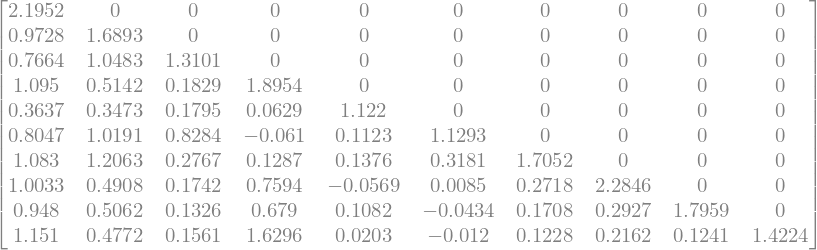

In [96]:
A_1 = np.linalg.cholesky(data_cov)
sp.Matrix(A_1.round(4))

### 生成1000*10的标准正态样本

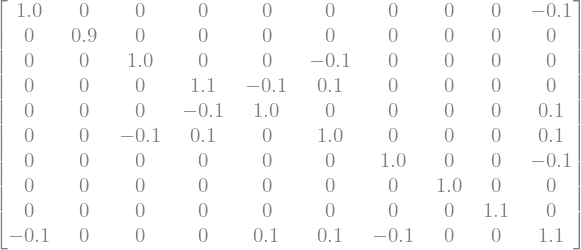

In [125]:
multi_norm_rvs_10 = np.zeros((1000,10))
multi_norm_rvs_10 = np.apply_along_axis(lambda x:np.random.normal(0,1,1000),0,multi_norm_rvs_10)
multi_norm_rvs_10
sp.Matrix(np.cov(multi_norm_rvs_10,rowvar=False).round(1))

In [130]:
pd.plotting.scatter_matrix(pd.DataFrame(multi_norm_rvs_10),figsize=(14,10), diagonal = 'kde');

## 生成具有特定结构的多元正态

In [131]:
A_1.

# Copula 函数

In [3]:
mu = np.array([0,0])
cov = np.array([[1,0.4],
                [0.4,1]])

In [12]:
mn = stats.multivariate_normal(mu,cov)
n1 = stats.norm(mu[0],cov[0,0])
n2 = stats.norm(mu[1],cov[1,1])

In [21]:
n1.ppf

In [34]:
def copula_multinormal_2(lst):
    return mn.cdf([n1.ppf(lst[0]),n2.ppf(lst[1])])

In [36]:
copula_multinormal_2([1,0.5])

In [38]:
def generate_copula(arr):
    return np.apply_along_axis(lambda x:np.array([n1.cdf(x[0]),n2.cdf(x[1])]),1,arr)

In [43]:
XX = generate_copula(mn.rvs(1000))

(array([ 96.,  94., 100., 116.,  96.,  98.,  89., 101., 102., 108.]),
 array([3.38022665e-04, 1.00291442e-01, 2.00244861e-01, 3.00198280e-01,
        4.00151699e-01, 5.00105118e-01, 6.00058537e-01, 7.00011957e-01,
        7.99965376e-01, 8.99918795e-01, 9.99872214e-01]),
 <BarContainer object of 10 artists>)

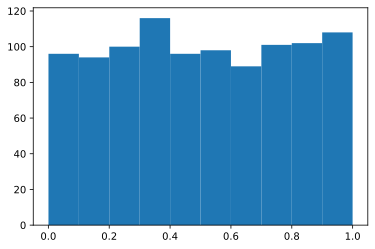

In [60]:
plt.hist(XX[:,1],density=False)
#plt.plot(XX[:,0],color='red')


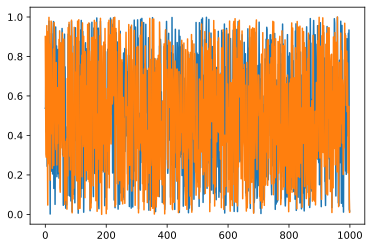

In [61]:
plt.plot(XX)